#**Object Detection Using Cows And Buffalo Computer Vision Dataset**

**Objective:** The primary objective of this project is to develop and train an object detection model capable of accurately identifying and localizing cows and buffalo within images. This can be useful for applications such as livestock monitoring, population counting, and automated farming.

**Problem Statement:** The dataset contains images of cows and buffalo with bounding box annotations in YOLO format. The dataset exhibits class imbalance, with some classes having significantly fewer instances than others. Classes with very few instances (specifically classes 9 and 10) have been removed. The task is to train a robust object detection model that can handle this imbalance and perform well on unseen data.

**Methodology:** The project follows a standard object detection pipeline:
1. **Data Loading and Exploration:** Load the image and label data, analyze the class distribution, bounding box sizes, and aspect ratios.
2. **Data Preprocessing and Splitting:** Clean the dataset by removing classes with very few instances and split the data into training, validation, and test sets.
3. **Data Augmentation:** Apply augmentation techniques to the training data, focusing on increasing the number of instances for underrepresented classes to mitigate class imbalance. The augmented data is combined with the original training data.
4. **Model Training:** Train YOLOv8 object detection models (YOLOv8s, YOLOv8m, and YOLOv8l) on the combined training data.
5. **Model Evaluation:** Evaluate the trained models on the validation set to assess their performance using metrics like Precision, Recall, mAP50, and mAP50-95.
6. **Inference:** Use the trained models to make predictions on new images from the test set.

**Models Used:**
* **Feature Extraction:** ResNet50 pretrained on ImageNet is used to extract image features for similarity and cluster analysis.
* **Object Detection:** YOLOv8s, YOLOv8m, and YOLOv8l are used as the primary object detection models.
* **Dimensionality Reduction:** UMAP is used for visualizing the image embeddings in a lower-dimensional space.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
from google.colab import drive
from collections import Counter
import random
drive.mount('/content/drive')



Mounted at /content/drive


**Loading the data**


In [2]:
datadir = '/content/drive/MyDrive/dataset/Cows and Buffalo/train'
images = os.path.join(datadir,'images')
labels = os.path.join(datadir,'labels')

In [ ]:
image_files = [f for f in os.listdir(images) if f.endswith(('.jpg', '.png'))]
def read_labels(label_path):
    boxes = []
    with open(label_path, 'r') as file:
        for line in file.readlines():
            class_id, x_center, y_center, width, height = map(float, line.strip().split())
            boxes.append({
                'class_id': int(class_id),
                'x_center': x_center,
                'y_center': y_center,
                'width': width,
                'height': height
            })
    return boxes


#Data Analysis

In [ ]:
# Validate file counts
image_files = sorted([f for f in os.listdir(images) if f.endswith(('.jpg', '.png', '.jpeg'))])
label_files = sorted([f for f in os.listdir(labels) if f.endswith('.txt')])

print(f"Total images: {len(image_files)}")
print(f"Total label files: {len(label_files)}")

Total images: 1747
Total label files: 1747


In [ ]:
# Class Distribution
label_folder = labels
class_counter = Counter()
for label_file in os.listdir(label_folder):
    label_path = os.path.join(label_folder, label_file)
    with open(label_path, 'r') as f:
        for line in f:
            class_id = int(line.split()[0])
            class_counter[class_id] += 1

total_instances = sum(class_counter.values())

print(f"{'Class ID':<10}{'Count':<10}{'Percentage':<10}")
print("-" * 30)
for cls_id, count in sorted(class_counter.items()):
    percent = (count / total_instances) * 100
    print(f"{cls_id:<10}{count:<10}{percent:>8.2f}%")

Class ID  Count     Percentage
------------------------------
0         3063         61.74%
1         43            0.87%
2         352           7.10%
3         21            0.42%
4         61            1.23%
5         25            0.50%
6         63            1.27%
7         775          15.62%
8         471           9.49%
9         2             0.04%
10        2             0.04%
11        83            1.67%


**Removing the rare occurance classes ( 9 & 10 ) and splitting the data to train, test and validation set**

The classes containing images that occur rarely in the dataset were removed. Class 9 and 10 had only 2 images in the dataset

In [ ]:
import shutil

# Paths
images_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/train/images'
labels_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/train/labels'
output_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset'

for split in ['train', 'val', 'test']:
    os.makedirs(os.path.join(output_dir, split, 'images'), exist_ok=True)
    os.makedirs(os.path.join(output_dir, split, 'labels'), exist_ok=True)

removed_classes = {'9', '10'}

# Helper function to clean label files
def clean_label_file(src, dest):
    with open(src) as f:
        lines = f.readlines()
    cleaned = [line for line in lines if not line.startswith(tuple(removed_classes))]
    if cleaned:
        with open(dest, 'w') as f:
            f.writelines(cleaned)
        return True  # indicates label has at least one other annotation
    return False

# Filter images to keep only those with at least one annotation after class removal
filtered_files = []
for label_file in os.listdir(labels_dir):
    if not label_file.endswith('.txt'):
        continue
    src_label = os.path.join(labels_dir, label_file)
    temp_label = f'temp_{label_file}'
    if clean_label_file(src_label, temp_label):
        filtered_files.append(label_file)
    os.remove(temp_label)  # remove temp label

# Get corresponding images
image_files = [f.replace('.txt', '.jpg') for f in filtered_files]  # adjust if png

# Shuffle and split dataset (70/15/15)
random.seed(42)
n_total = len(image_files)
indexes = list(range(n_total))
random.shuffle(indexes)

train_end = int(0.7 * n_total)
val_end = int(0.85 * n_total)

splits = {
    'train': [image_files[i] for i in indexes[:train_end]],
    'val':   [image_files[i] for i in indexes[train_end:val_end]],
    'test':  [image_files[i] for i in indexes[val_end:]]
}

for split, imgs in splits.items():
    for img_file in imgs:
        # Copy image
        src_img = os.path.join(images_dir, img_file)
        dest_img = os.path.join(output_dir, split, 'images', img_file)
        if os.path.exists(src_img):
            shutil.copy(src_img, dest_img)
        # Cleaned label file (remove class 9 and 10 lines)
        label_file = img_file.replace('.jpg', '.txt')  # adjust if png
        src_label = os.path.join(labels_dir, label_file)
        dest_label = os.path.join(output_dir, split, 'labels', label_file)
        clean_label_file(src_label, dest_label)

  print("Class 9 and class 10 removed. Dataset has been split into train, validation, and test sets.")


Class 9 and class 10 removed. Dataset has been split into train, validation, and test sets.


In [ ]:
train_labels_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/train/labels'

class_counter = Counter()
label_files = [f for f in os.listdir(train_labels_dir) if f.endswith('.txt')]

for label_file in label_files:
    with open(os.path.join(train_labels_dir, label_file), 'r') as f:
        for line in f:
            class_id = int(line.split()[0])
            class_counter[class_id] += 1

print("Training set class distribution:")
for cls_id, count in sorted(class_counter.items()):
    print(f"Class {cls_id}: {count} instances")


Training set class distribution:
Class 0: 2054 instances
Class 1: 28 instances
Class 2: 263 instances
Class 3: 13 instances
Class 4: 43 instances
Class 5: 19 instances
Class 6: 49 instances
Class 7: 524 instances
Class 8: 332 instances
Class 11: 49 instances


**Class Distribution and Balance Analysis in Training Data**

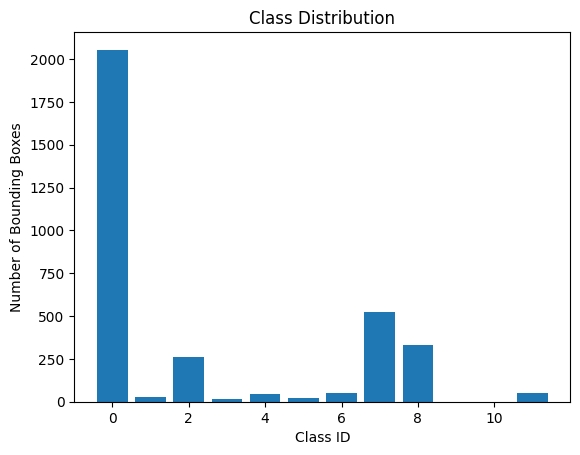

In [ ]:
labels_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/train/labels'
class_counter = Counter()

for label_file in os.listdir(labels_dir):
    if label_file.endswith('.txt'):
        with open(os.path.join(labels_dir, label_file), 'r') as f:
            for line in f:
                class_id = int(line.split()[0])
                class_counter[class_id] += 1

classes, counts = zip(*sorted(class_counter.items()))
plt.bar(classes, counts)
plt.xlabel('Class ID')
plt.ylabel('Number of Bounding Boxes')
plt.title('Class Distribution')
plt.show()


**Bounding Box Size and Aspect Ratio Analysis**

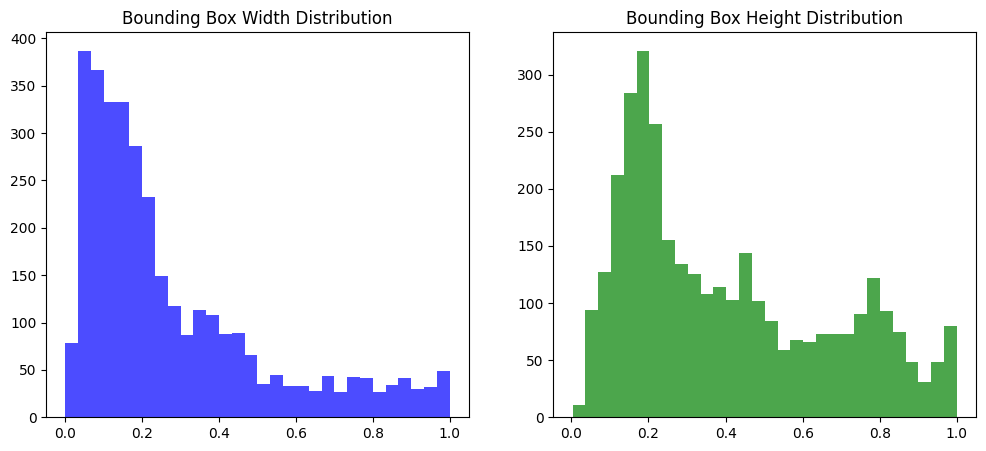

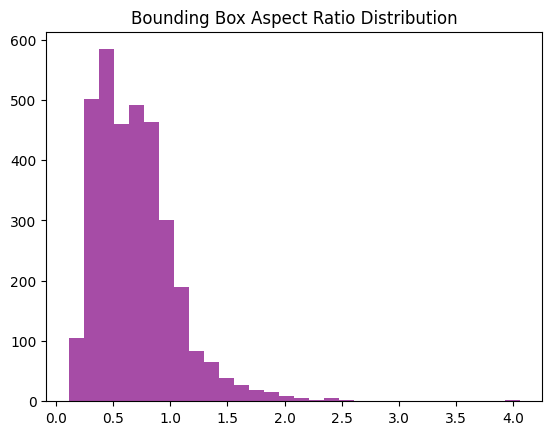

In [ ]:
widths, heights = [], []
labels_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/train/labels'

for label_file in os.listdir(labels_dir):
    if label_file.endswith('.txt'):
        with open(os.path.join(labels_dir, label_file), 'r') as f:
            for line in f:
                parts = line.split()
                w, h = float(parts[3]), float(parts[4])  # YOLO normalized width, height
                widths.append(w)
                heights.append(h)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.hist(widths, bins=30, color='blue', alpha=0.7)
plt.title('Bounding Box Width Distribution')
plt.subplot(1, 2, 2)
plt.hist(heights, bins=30, color='green', alpha=0.7)
plt.title('Bounding Box Height Distribution')
plt.show()

# Aspect ratio
ratios = [w / h if h !=0 else 0 for w, h in zip(widths, heights)]
plt.hist(ratios, bins=30, color='purple', alpha=0.7)
plt.title('Bounding Box Aspect Ratio Distribution')
plt.show()


 **Annotation Quality Auditing (Random Visual Sample)**

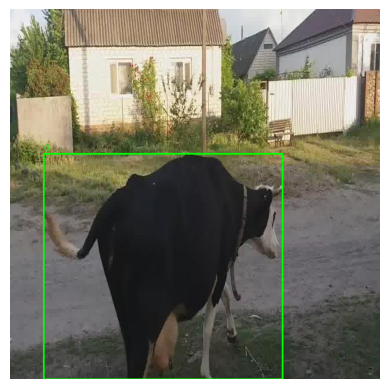

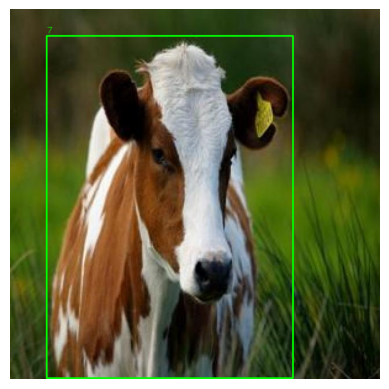

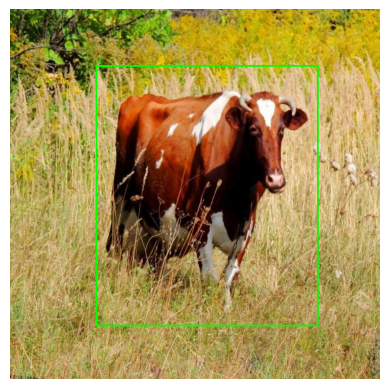

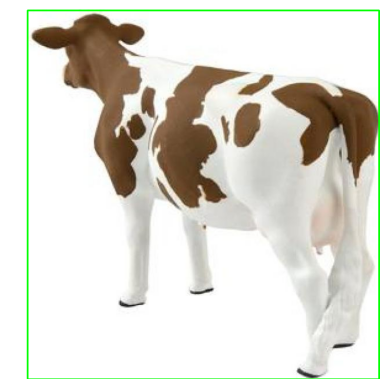

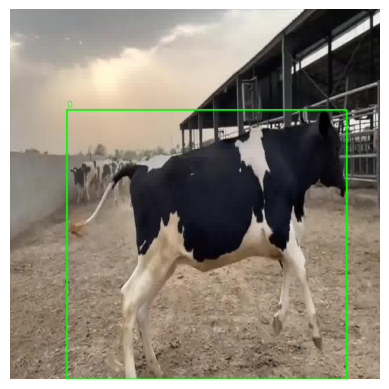

In [ ]:

images_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/train/images'
labels_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/train/labels'

def plot_image_with_boxes(img_path, label_path):
    img = cv2.imread(img_path)
    h, w = img.shape[:2]
    with open(label_path) as f:
        for line in f:
            cls, x_center, y_center, bw, bh = map(float, line.strip().split())
            x1 = int((x_center - bw / 2) * w)
            y1 = int((y_center - bh / 2) * h)
            x2 = int((x_center + bw / 2) * w)
            y2 = int((y_center + bh / 2) * h)
            cv2.rectangle(img, (x1,y1), (x2,y2), (0,255,0), 2)
            cv2.putText(img, str(int(cls)), (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,255,0), 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

random_samples = random.sample(os.listdir(images_dir), 5)
for img_file in random_samples:
    label_file = img_file.rsplit('.',1)[0] + '.txt'
    plot_image_with_boxes(os.path.join(images_dir,img_file), os.path.join(labels_dir,label_file))


**Similarity and Cluster Analysis with UMAP**

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing import image

# Initialize CNN model without top layer for feature extraction
model = ResNet50(weights='imagenet', include_top=False, pooling='avg')

images_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/train/images'
label_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/train/labels'

# Get list of images and their labels
image_files = sorted([f for f in os.listdir(images_dir) if f.endswith('.jpg')])

all_features = []
all_labels = []

for img_file in image_files:
    # Load and preprocess image
    img_path = os.path.join(images_dir, img_file)
    img = image.load_img(img_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)

    # Extract features
    features = model.predict(x)
    all_features.append(features.flatten())

    # Get label class IDs from label file
    label_file = img_file.replace('.jpg', '.txt')
    with open(os.path.join(label_dir, label_file)) as f:
        lines = f.readlines()
        class_id = int(lines[0].split()[0]) if lines else -1  # -1 for empty label files
    all_labels.append(class_id)

all_features = np.array(all_features)
all_labels = np.array(all_labels)


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


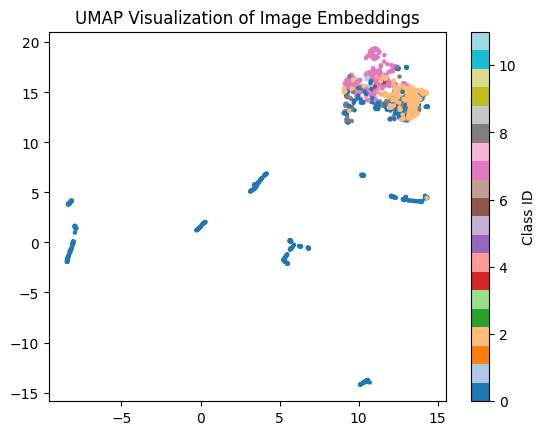

In [ ]:
import umap

reducer = umap.UMAP(random_state=42)
embedding = reducer.fit_transform(all_features)

plt.scatter(embedding[:,0], embedding[:,1], c=all_labels, cmap='tab20', s=5)
plt.colorbar(label='Class ID')
plt.title('UMAP Visualization of Image Embeddings')
plt.show()


**Class Co-occurrence Heatmap**

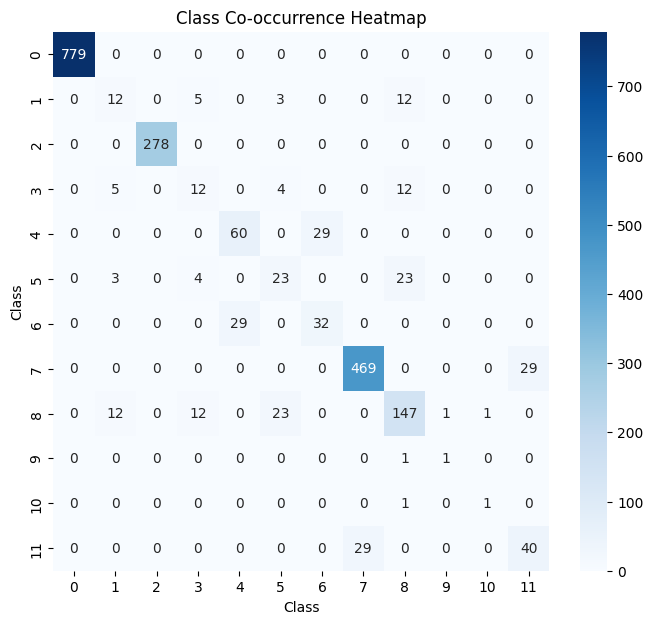

In [ ]:
import seaborn as sns
from collections import defaultdict


labels_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/train/labels'
num_classes = 12
cooc = np.zeros((num_classes, num_classes), dtype=int)

for label_file in os.listdir(labels_dir):
    if label_file.endswith('.txt'):
        with open(os.path.join(labels_dir, label_file)) as f:
            classes = set(int(line.split()[0]) for line in f)
            for c1 in classes:
                for c2 in classes:
                    cooc[c1, c2] += 1

plt.figure(figsize=(8,7))
sns.heatmap(cooc, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Class')
plt.ylabel('Class')
plt.title('Class Co-occurrence Heatmap')
plt.show()


**Data Augmentation To Handle The Class Imbalance**

In [ ]:
import albumentations as A


# Class distribution with designed augmentation counts based on rarity
class_counts = {
    0: 2054, 1: 28, 2: 263, 3: 13,
    4: 43, 5: 19, 6: 49, 7: 524,
    8: 332, 11: 49
}

# Augmentation count mapping: class -> augment times per image
def get_augmentation_count(cls):
    if class_counts[cls] < 50:
        return 10   # Very rare classes
    elif class_counts[cls] < 300:
        return 3    # Moderate classes
    else:
        return 1    # Majority classes (minimal or no augmentation)

# Albumentations augmentation pipelines
minority_augment = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.3),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, p=0.7),
    A.CoarseDropout(max_holes=8, max_height=16, max_width=16, p=0.5),
], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

majority_augment = A.Compose([], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))
# No augmentation pipeline for majority class; can add light augmentation if desired

# Paths
images_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/train/images'
labels_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/train/labels'

aug_images_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/augmented/images'
aug_labels_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/augmented/labels'
os.makedirs(aug_images_dir, exist_ok=True)
os.makedirs(aug_labels_dir, exist_ok=True)

def load_labels(label_path):
    bboxes = []
    classes = []
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            cls = int(float(parts[0]))
            bbox = list(map(float, parts[1:5]))
            classes.append(cls)
            bboxes.append(bbox)
    return classes, bboxes

def save_labels(filepath, classes, bboxes):
    with open(filepath, 'w') as f:
        for cls, bbox in zip(classes, bboxes):
            line = f"{cls} {' '.join(map(str, bbox))}\n"
            f.write(line)

def augment_and_save(img_file, augment_pipeline, aug_index):
    img_path = os.path.join(images_dir, img_file)
    label_path = os.path.join(labels_dir, img_file.replace('.jpg', '.txt'))

    img = cv2.imread(img_path)
    classes, bboxes = load_labels(label_path)
    if len(bboxes) == 0:
        return

    augmented = augment_pipeline(image=img, bboxes=bboxes, class_labels=classes)
    aug_img = augmented['image']
    aug_bboxes = augmented['bboxes']
    aug_classes = augmented['class_labels']

    if len(aug_bboxes) == 0:
        return

    out_img_name = f"aug_{aug_index}_{img_file}"
    out_label_name = out_img_name.replace('.jpg', '.txt')

    cv2.imwrite(os.path.join(aug_images_dir, out_img_name), aug_img)
    save_labels(os.path.join(aug_labels_dir, out_label_name), aug_classes, aug_bboxes)

# Main loop applying class-aware augmentation counts
image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg')]
random.seed(42)
random.shuffle(image_files)

aug_index = 0

for img_file in image_files:
    label_path = os.path.join(labels_dir, img_file.replace('.jpg', '.txt'))
    classes, _ = load_labels(label_path)

    # Determine max augment count among classes in image
    aug_counts = [get_augmentation_count(cls) for cls in set(classes)]
    max_aug_count = max(aug_counts) if aug_counts else 1

    if max_aug_count > 1:
        for _ in range(max_aug_count):
            augment_and_save(img_file, minority_augment, aug_index)
            aug_index += 1
    else:
        augment_and_save(img_file, majority_augment, aug_index)
        aug_index += 1

print(f"Augmentation completed. Total augmented images created: {aug_index}.")


/tmp/ipython-input-2171925874.py:25: UserWarning: Argument(s) 'max_holes, max_height, max_width' are not valid for transform CoarseDropout
  A.CoarseDropout(max_holes=8, max_height=16, max_width=16, p=0.5),


Augmentation completed. Total augmented images created: 2507.


In [ ]:
import os
from collections import Counter

augmented_labels_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/augmented/labels'

augmented_files = [f for f in os.listdir(augmented_labels_dir) if f.endswith('.txt')]
print(f"Total augmented label files: {len(augmented_files)}")

class_counter = Counter()
augmented_images = []

for label_file in augmented_files:
    file_path = os.path.join(augmented_labels_dir, label_file)
    with open(file_path, 'r') as f:
        lines = f.readlines()
        if lines:
            augmented_images.append(label_file.replace('.txt', '.jpg'))
        for line in lines:
            cls = int(float(line.split()[0]))
            class_counter[cls] += 1

print("\nCount of augmented instances per class:")
for cls, count in sorted(class_counter.items()):
    print(f"Class {cls}: {count} instances")

print(f"\nTotal augmented images containing annotations: {len(augmented_images)}")


Total augmented label files: 2507

Count of augmented instances per class:
Class 0: 2054 instances
Class 1: 278 instances
Class 2: 789 instances
Class 3: 128 instances
Class 4: 430 instances
Class 5: 188 instances
Class 6: 489 instances
Class 7: 1062 instances
Class 8: 682 instances
Class 11: 490 instances

Total augmented images containing annotations: 2507


**Combining the train data with the augmented data**

In [ ]:
import os
import shutil

# Source directories
train_images_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/train/images'
train_labels_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/train/labels'

aug_images_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/augmented/images'
aug_labels_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/augmented/labels'

# Destination combined folder
combined_base_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/combined_train'
combined_images_dir = os.path.join(combined_base_dir, 'images')
combined_labels_dir = os.path.join(combined_base_dir, 'labels')

os.makedirs(combined_images_dir, exist_ok=True)
os.makedirs(combined_labels_dir, exist_ok=True)

def copy_files(src_dir, dest_dir):
    for filename in os.listdir(src_dir):
        src = os.path.join(src_dir, filename)
        dest = os.path.join(dest_dir, filename)
        if not os.path.exists(dest):
            shutil.copy(src, dest)

# Copy original training images and labels
copy_files(train_images_dir, combined_images_dir)
copy_files(train_labels_dir, combined_labels_dir)

# Copy augmented images and labels
copy_files(aug_images_dir, combined_images_dir)
copy_files(aug_labels_dir, combined_labels_dir)

print(f"Combined dataset created at {combined_base_dir}")
print(f"Total images: {len(os.listdir(combined_images_dir))}")
print(f"Total labels: {len(os.listdir(combined_labels_dir))}")


Combined dataset created at /content/drive/MyDrive/dataset/Cows and Buffalo/combined_train
Total images: 3729
Total labels: 3729


In [ ]:
import os
from collections import Counter

combined_labels_dir = '/content/drive/MyDrive/dataset/Cows and Buffalo/combined_train/labels'

class_counter = Counter()

for label_file in os.listdir(combined_labels_dir):
    if label_file.endswith('.txt'):
        with open(os.path.join(combined_labels_dir, label_file), 'r') as f:
            for line in f:
                cls = int(float(line.split()[0]))  # convert '0.0' to int 0 safely
                class_counter[cls] += 1

print("Class distribution in combined dataset:")
for cls, count in sorted(class_counter.items()):
    print(f"Class {cls}: {count} instances")


Class distribution in combined dataset:
Class 0: 4108 instances
Class 1: 306 instances
Class 2: 1052 instances
Class 3: 141 instances
Class 4: 473 instances
Class 5: 207 instances
Class 6: 538 instances
Class 7: 1586 instances
Class 8: 1014 instances
Class 11: 539 instances


##**Training YOLO V8 models**

In [4]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 28.8 MB/s eta 0:00:00


**Creating a YAML file for Dataset Information**

In [5]:
yaml_content = """
path: /content/drive/MyDrive/dataset/Cows and Buffalo
train: combined_train/images
val: split_dataset/val/images
test: split_dataset/test/images

nc: 10

names:
  0: class0
  1: class1
  2: class2
  3: class3
  4: class4
  5: class5
  6: class6
  7: class7
  8: class8
  9: class11
"""

yaml_path = '/content/drive/MyDrive/dataset/Cows and Buffalo/cows_buffalo.yaml'
with open(yaml_path, 'w') as f:
    f.write(yaml_content)

print(f"YOLOv8 dataset yaml updated at {yaml_path}")


YOLOv8 dataset yaml updated at /content/drive/MyDrive/dataset/Cows and Buffalo/cows_buffalo.yaml


##**yolov8s**

In [ ]:
from ultralytics import YOLO

# Load YOLOv8 small pretrained model
model = YOLO('yolov8s.pt')

# Train with your custom dataset
model.train(
    data='/content/drive/MyDrive/dataset/Cows and Buffalo/cows_buffalo.yaml',
    epochs=20,
    imgsz=640,
    batch=16,
    device=0,       # use GPU; change to 'cpu' if no GPU
    name='yolov8_cowsbuffalo'
)

# After training, evaluate on validation set
metrics = model.val()
print(metrics)

# Explicitly save the trained model weights
# This saves to specified path (adjust as needed)
model.save('/content/drive/MyDrive/dataset/Cows and Buffalo/yolov8s.pt')



Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.202 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/dataset/Cows and Buffalo/cows_buffalo.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz

**Evalutaion Matrix**

In [6]:
from ultralytics import YOLO
import pandas as pd

def evaluate_model(model_path, model_name, val_data_path):
    model = YOLO(model_path)
    results = model.val(data=val_data_path, save=False)

    # results is an object of DetMetrics type
    metrics = results

    # Use results_dict() to get overall key metrics
    overall_metrics_dict = metrics.results_dict

    overall_metrics = {
        'Model': model_name,
        'Precision': overall_metrics_dict.get('metrics/precision(B)', None),
        'Recall': overall_metrics_dict.get('metrics/recall(B)', None),
        'mAP50': overall_metrics_dict.get('metrics/mAP50(B)', None),
        'mAP50-95': overall_metrics_dict.get('metrics/mAP50-95(B)', None),
        'Fitness': overall_metrics_dict.get('fitness', None)
    }

    # Use maps() method to get per-class mAP scores (mAP50)
    per_class_map50 = metrics.maps  # list or array

    # Class names
    class_names = model.names

    per_class_df = pd.DataFrame({
        'Class': [class_names[i] if i < len(class_names) else f'class{i}' for i in range(len(per_class_map50))],
        'mAP50': per_class_map50
    })

    return overall_metrics, per_class_df

val_data_path = '/content/drive/MyDrive/dataset/Cows and Buffalo/cows_buffalo.yaml'
model_path = '/content/drive/MyDrive/dataset/Cows and Buffalo/yolov8s.pt'
model_name = 'YOLOv8s'

overall, per_class_metrics = evaluate_model(model_path, model_name, val_data_path)

print("Overall Metrics:")
print(overall)

print("\nPer-Class mAP50:")
print(per_class_metrics)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


**Prediction**

Prediction for image: hf02-202_jpeg_jpg.rf.10501bb3af2092e86b7c4fec402e4c5e.jpg

0: 640x640 5 class0s, 24.8ms
Speed: 2.3ms preprocess, 24.8ms inference, 9.2ms postprocess per image at shape (1, 3, 640, 640)


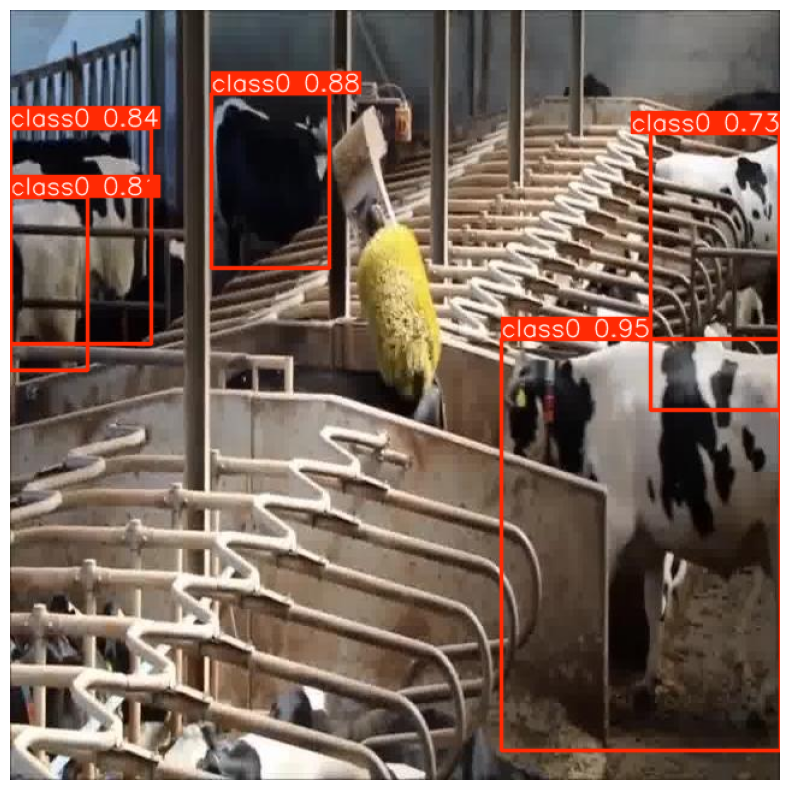

Prediction for image: hf02-32_jpeg_jpg.rf.ab8bb6ddb47495bd602bb9bdd5f63acf.jpg

0: 640x640 3 class0s, 32.2ms
Speed: 2.4ms preprocess, 32.2ms inference, 14.2ms postprocess per image at shape (1, 3, 640, 640)


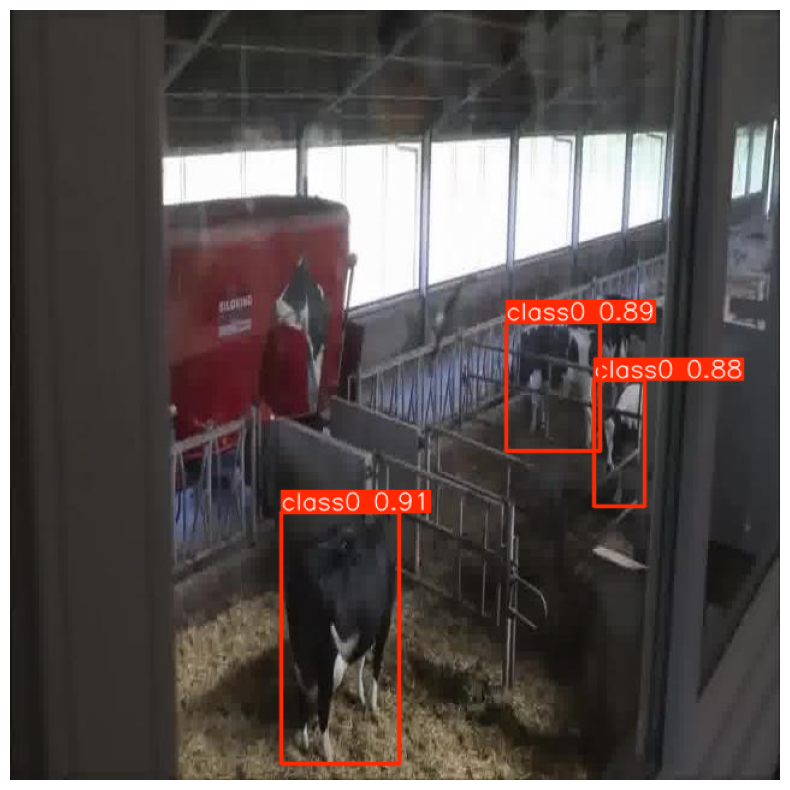

Prediction for image: img00151_jpg.rf.7dac751f570fcadfcf4d57f915c5d61b.jpg

0: 640x640 1 class5, 1 class8, 74.1ms
Speed: 6.4ms preprocess, 74.1ms inference, 13.4ms postprocess per image at shape (1, 3, 640, 640)


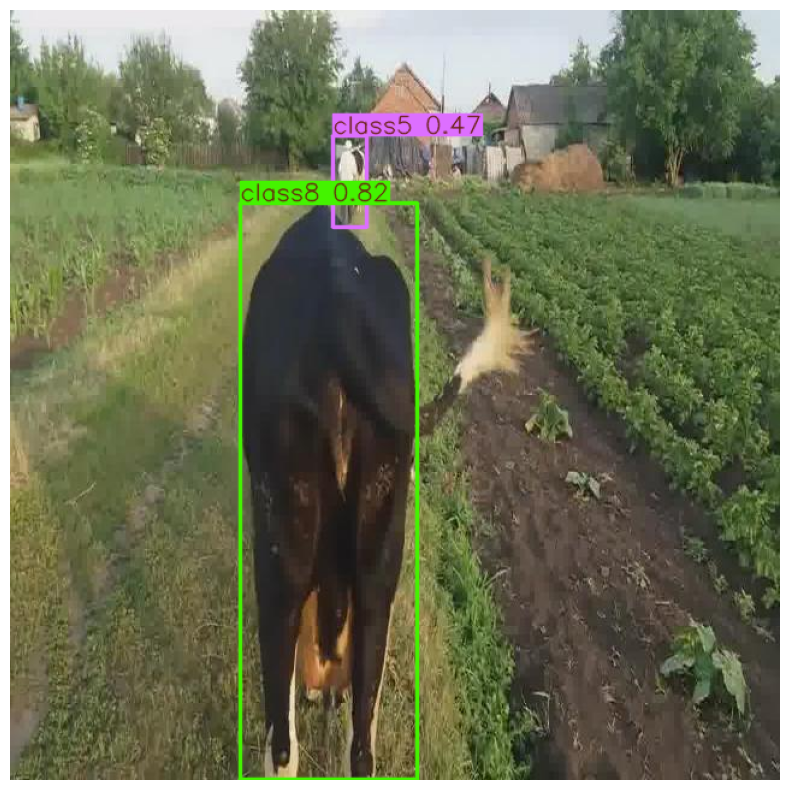

Prediction for image: hf03-53_jpeg_jpg.rf.408cd913067272408aa1c884e1826978.jpg

0: 640x640 7 class0s, 21.8ms
Speed: 4.1ms preprocess, 21.8ms inference, 6.6ms postprocess per image at shape (1, 3, 640, 640)


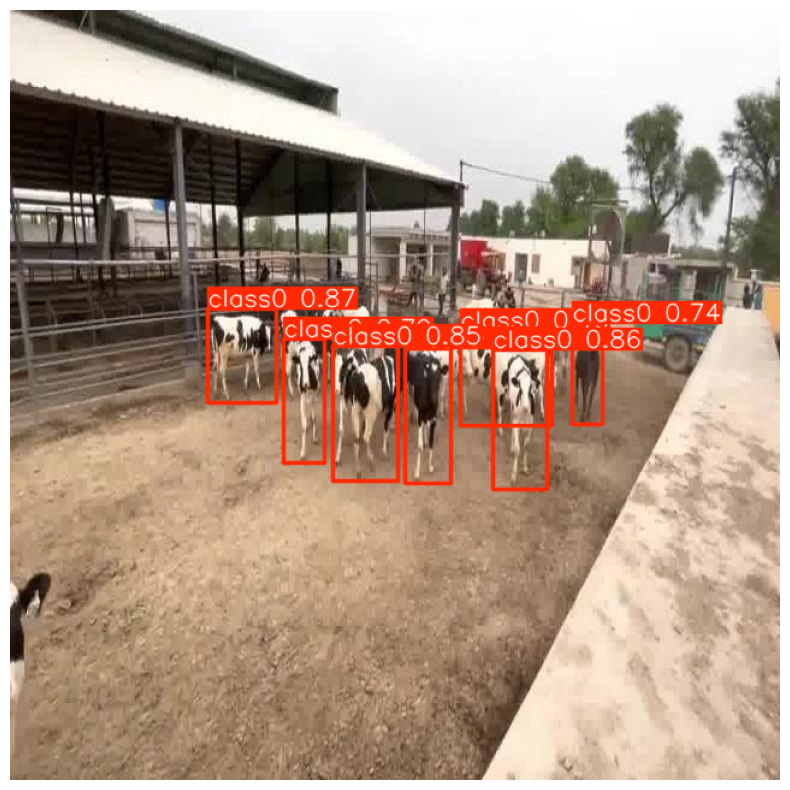

Prediction for image: Ayrshirecattle65_c_jpg.rf.af39a0a11ba6830a0682a07edf7eea3d.jpg

0: 640x640 1 class7, 16.4ms
Speed: 2.4ms preprocess, 16.4ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


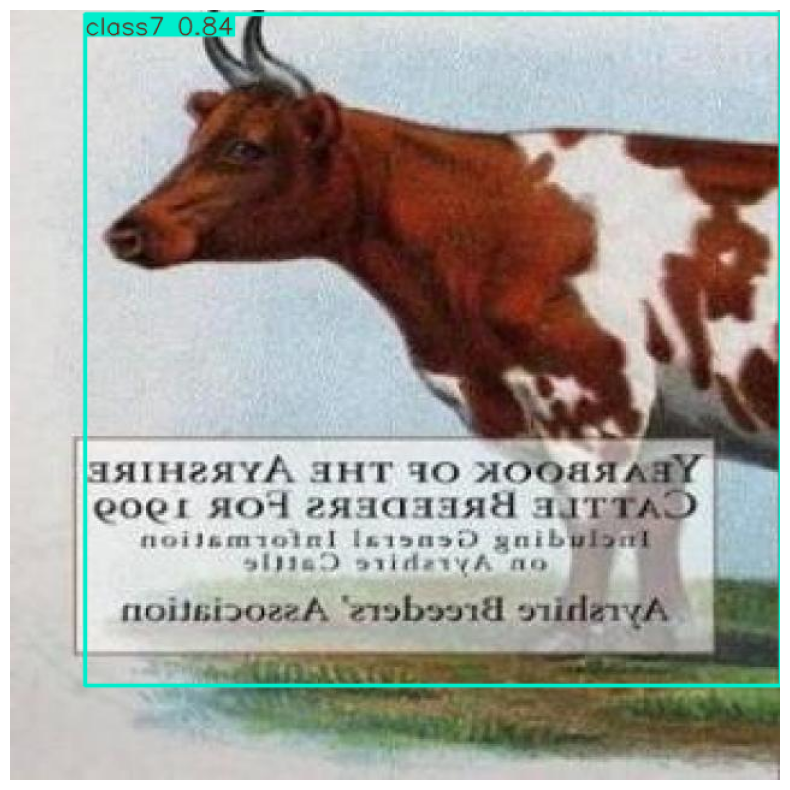

In [ ]:
import cv2
import matplotlib.pyplot as plt
from pathlib import Path
from ultralytics import YOLO

# Load trained YOLOv8 model
model_path = '/content/drive/MyDrive/dataset/Cows and Buffalo/yolov8s.pt'
model = YOLO(model_path)

# Path to test images
test_images_dir = Path('/content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/test/images')

def predict_and_show(image_path):
    img = cv2.imread(str(image_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Make prediction
    results = model.predict(img_rgb)
    result_img = results[0].plot()  # draw boxes/labels

    # Display
    plt.figure(figsize=(10,10))
    plt.imshow(result_img)
    plt.axis('off')
    plt.show()

# Show predictions for first 5 images

image_files = list(test_images_dir.glob('*.jpg'))
for idx, img_file in enumerate(image_files[1:], start=2):
    print(f'Prediction for image: {img_file.name}')
    predict_and_show(img_file)
    if idx > 5:
        break


##**yolov8m**

In [ ]:
from ultralytics import YOLO

# Load YOLOv8 medum pretrained model
model = YOLO('yolov8m.pt')

# Train with your custom dataset
model.train(
    data='/content/drive/MyDrive/dataset/Cows and Buffalo/cows_buffalo.yaml',
    epochs=20,
    imgsz=640,
    batch=16,
    device=0,
    name='yolov8_cowsbuffalo'
)

# After training, evaluate on validation set
metrics = model.val()
print(metrics)

# Explicitly save the trained model weights
model.save('/content/drive/MyDrive/dataset/Cows and Buffalo/yolov8m.pt')



Ultralytics 8.3.202 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/dataset/Cows and Buffalo/cows_buffalo.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8_cowsbuffalo, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, pa

**Evalutaion Matrix**

In [ ]:
val_data_path = '/content/drive/MyDrive/dataset/Cows and Buffalo/cows_buffalo.yaml'
model_path = '/content/drive/MyDrive/dataset/Cows and Buffalo/yolov8m.pt'
model_name = 'YOLOv8m'

overall, per_class_metrics = evaluate_model(model_path, model_name, val_data_path)

print("Overall Metrics:")
print(overall)

print("\nPer-Class mAP50:")
print(per_class_metrics)

Ultralytics 8.3.202 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 2.1±2.5 ms, read: 23.3±25.9 MB/s, size: 61.3 KB)
val: Scanning /content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/val/labels.cache... 262 images, 0 backgrounds, 7 corrupt: 100% ━━━━━━━━━━━━ 262/262 110.7Kit/s 0.0s
val: /content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/val/images/Ayrshirecattle106_c_jpg.rf.3e705969cdb08277e562bcb41e5f4bd4.jpg: ignoring corrupt image/label: Label class 11 exceeds dataset class count 10. Possible class labels are 0-9
val: /content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/val/images/Ayrshirecattle107_c_jpg.rf.94743495a64f99326614a03202839ec6.jpg: ignoring corrupt image/label: Label class 11 exceeds dataset class count 10. Possible class labels are 0-9
val: /content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/val/images/Ayrshirecattle116_jpg.rf.aa4e9e14d02306f4141994d448518be5.jpg: ignoring corrupt im

**Prediction**

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Prediction for image: hf02-202_jpeg_jpg.rf.10501bb3af2092e86b7c4fec402e4c5e.jpg

0: 640x640 5 class0s, 37.1ms
Speed: 6.5ms preprocess, 37.1ms inference, 395.3ms postprocess per image at shape (1, 3, 640, 640)


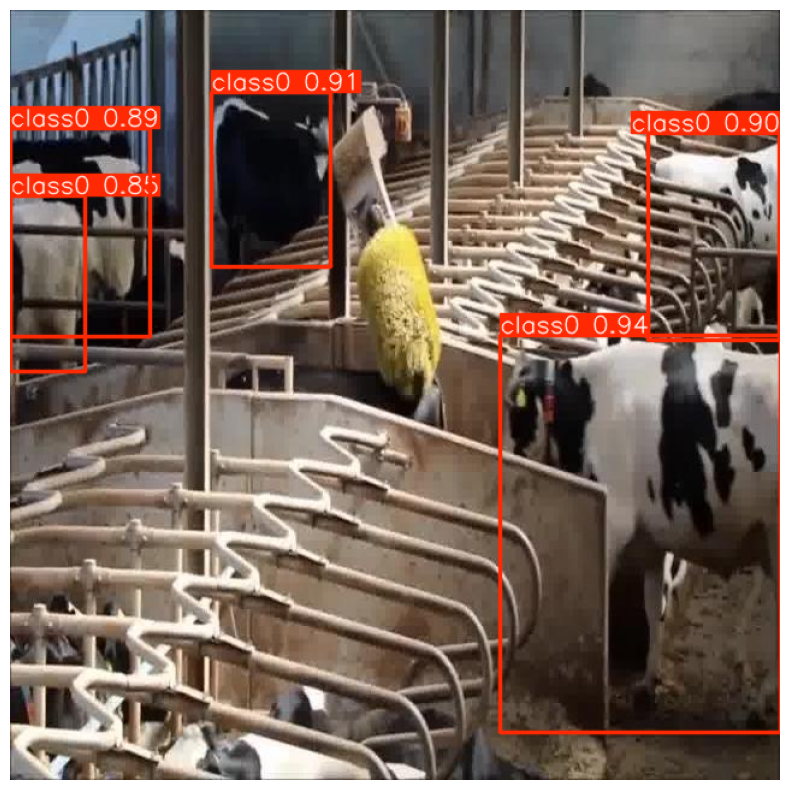

Prediction for image: hf02-32_jpeg_jpg.rf.ab8bb6ddb47495bd602bb9bdd5f63acf.jpg

0: 640x640 3 class0s, 37.1ms
Speed: 2.2ms preprocess, 37.1ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)


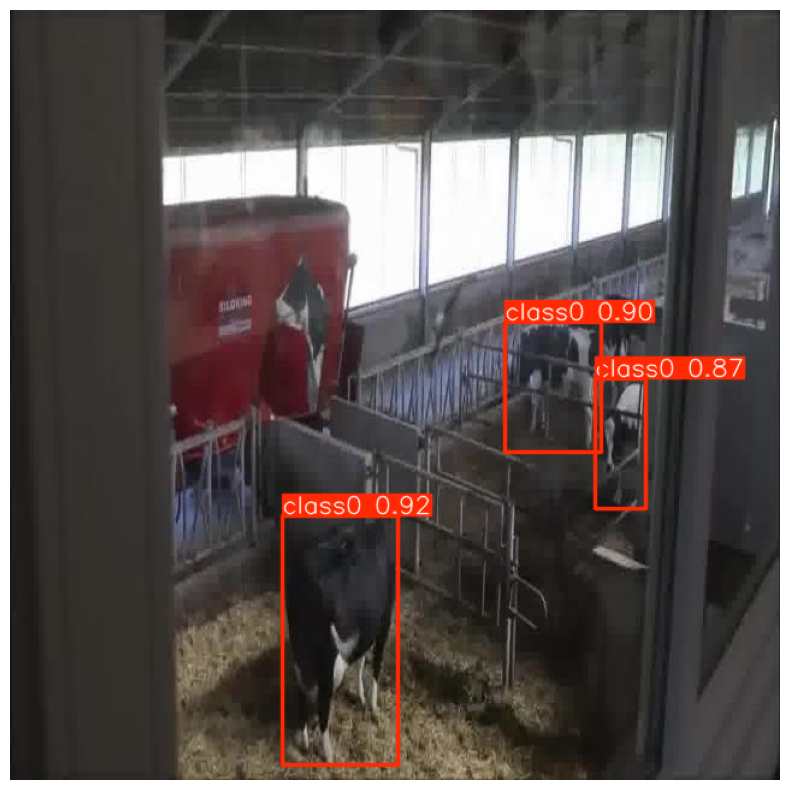

Prediction for image: img00151_jpg.rf.7dac751f570fcadfcf4d57f915c5d61b.jpg

0: 640x640 1 class0, 1 class5, 1 class8, 37.1ms
Speed: 3.6ms preprocess, 37.1ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


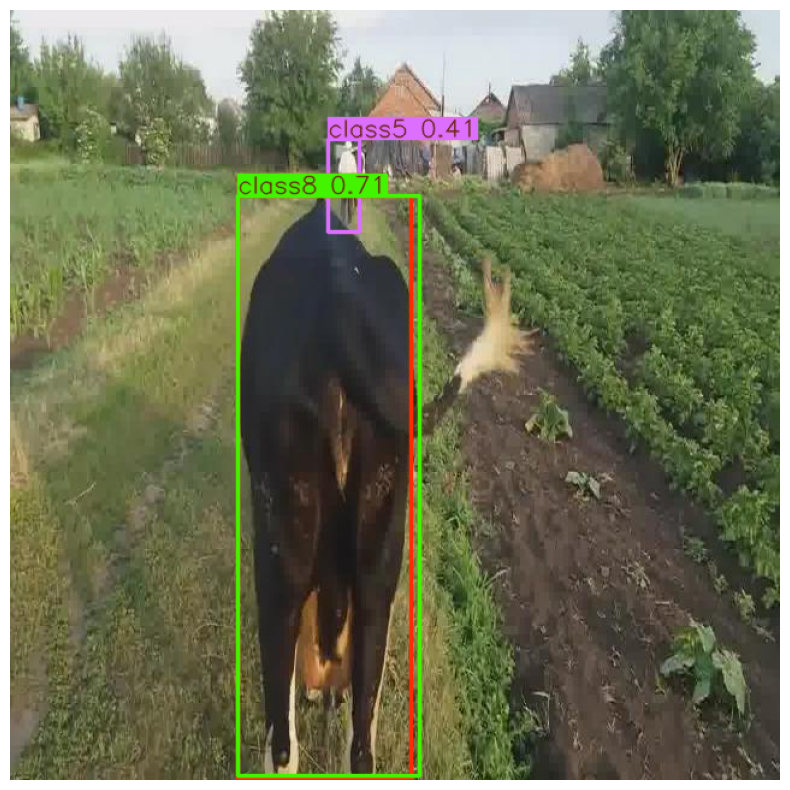

Prediction for image: hf03-53_jpeg_jpg.rf.408cd913067272408aa1c884e1826978.jpg

0: 640x640 8 class0s, 47.0ms
Speed: 2.1ms preprocess, 47.0ms inference, 5.6ms postprocess per image at shape (1, 3, 640, 640)


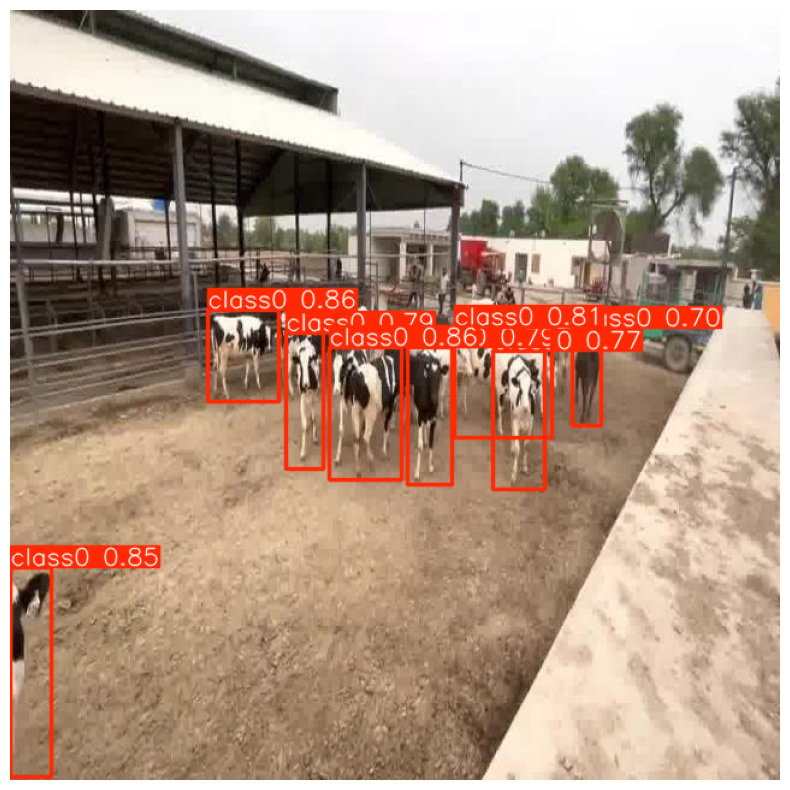

Prediction for image: Ayrshirecattle65_c_jpg.rf.af39a0a11ba6830a0682a07edf7eea3d.jpg

0: 640x640 1 class7, 40.0ms
Speed: 5.3ms preprocess, 40.0ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


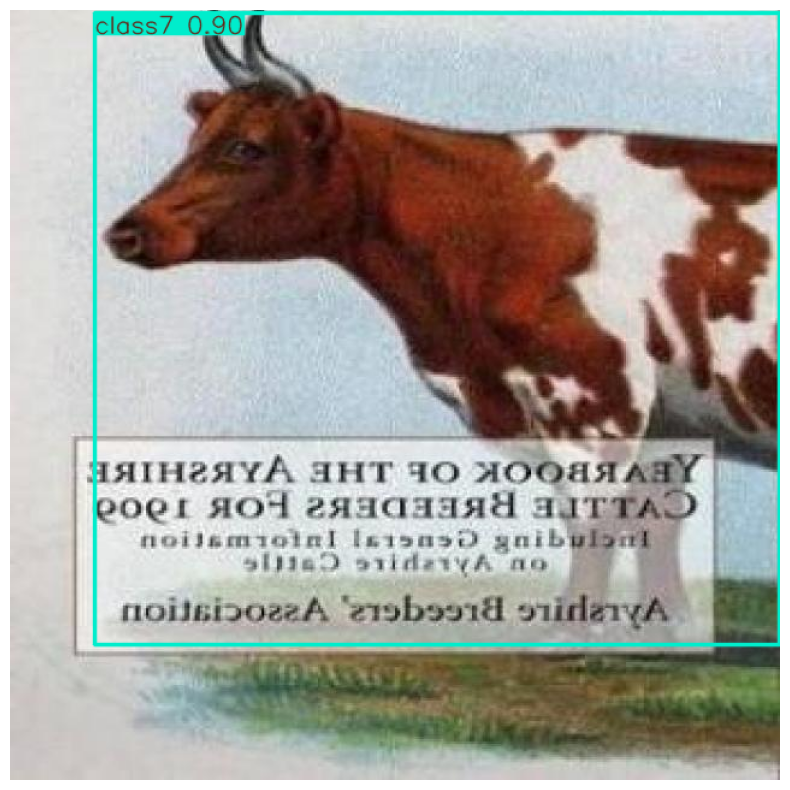

In [ ]:
import cv2
import matplotlib.pyplot as plt
from pathlib import Path
from ultralytics import YOLO

# Load trained YOLOv8 model
model_path = '/content/drive/MyDrive/dataset/Cows and Buffalo/yolov8m.pt'
model = YOLO(model_path)

# Path to test images
test_images_dir = Path('/content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/test/images')

def predict_and_show(image_path):
    img = cv2.imread(str(image_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Make prediction
    results = model.predict(img_rgb)
    result_img = results[0].plot()  # draw boxes/labels

    # Display
    plt.figure(figsize=(10,10))
    plt.imshow(result_img)
    plt.axis('off')
    plt.show()

# Show predictions for first 5 images

image_files = list(test_images_dir.glob('*.jpg'))
for idx, img_file in enumerate(image_files[1:], start=2):
    print(f'Prediction for image: {img_file.name}')
    predict_and_show(img_file)
    if idx > 5:
        break


##**yolov8l**

In [ ]:
from ultralytics import YOLO

# Load YOLOv8 large pretrained model
model = YOLO('yolov8l.pt')

# Train with custom dataset
model.train(
    data='/content/drive/MyDrive/dataset/Cows and Buffalo/cows_buffalo.yaml',
    epochs=20,
    imgsz=640,
    batch=16,
    device=0,
    name='yolov8_cowsbuffalo1'
)

# After training, evaluate on validation set
metrics = model.val()
print(metrics)

# Explicitly save the trained model weights
model.save('/content/drive/MyDrive/dataset/Cows and Buffalo/yolov8l.pt')



Ultralytics 8.3.202 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/dataset/Cows and Buffalo/cows_buffalo.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8l.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8_cowsbuffalo1, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, p

**Evalutaion Matrix**

In [ ]:
val_data_path = '/content/drive/MyDrive/dataset/Cows and Buffalo/cows_buffalo.yaml'
model_path = '/content/drive/MyDrive/dataset/Cows and Buffalo/yolov8l.pt'
model_name = 'YOLOv8l'

overall, per_class_metrics = evaluate_model(model_path, model_name, val_data_path)

print("Overall Metrics:")
print(overall)

print("\nPer-Class mAP50:")
print(per_class_metrics)

Ultralytics 8.3.202 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.6±0.4 ms, read: 19.1±13.1 MB/s, size: 65.8 KB)
val: Scanning /content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/val/labels.cache... 262 images, 0 backgrounds, 7 corrupt: 100% ━━━━━━━━━━━━ 262/262 320.6Kit/s 0.0s
val: /content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/val/images/Ayrshirecattle106_c_jpg.rf.3e705969cdb08277e562bcb41e5f4bd4.jpg: ignoring corrupt image/label: Label class 11 exceeds dataset class count 10. Possible class labels are 0-9
val: /content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/val/images/Ayrshirecattle107_c_jpg.rf.94743495a64f99326614a03202839ec6.jpg: ignoring corrupt image/label: Label class 11 exceeds dataset class count 10. Possible class labels are 0-9
val: /content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/val/images/Ayrshirecattle116_jpg.rf.aa4e9e14d02306f4141994d448518be5.jpg: ignoring corrupt im

**Prediction**

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Prediction for image: hf02-202_jpeg_jpg.rf.10501bb3af2092e86b7c4fec402e4c5e.jpg

0: 640x640 5 class0s, 37.1ms
Speed: 6.5ms preprocess, 37.1ms inference, 395.3ms postprocess per image at shape (1, 3, 640, 640)


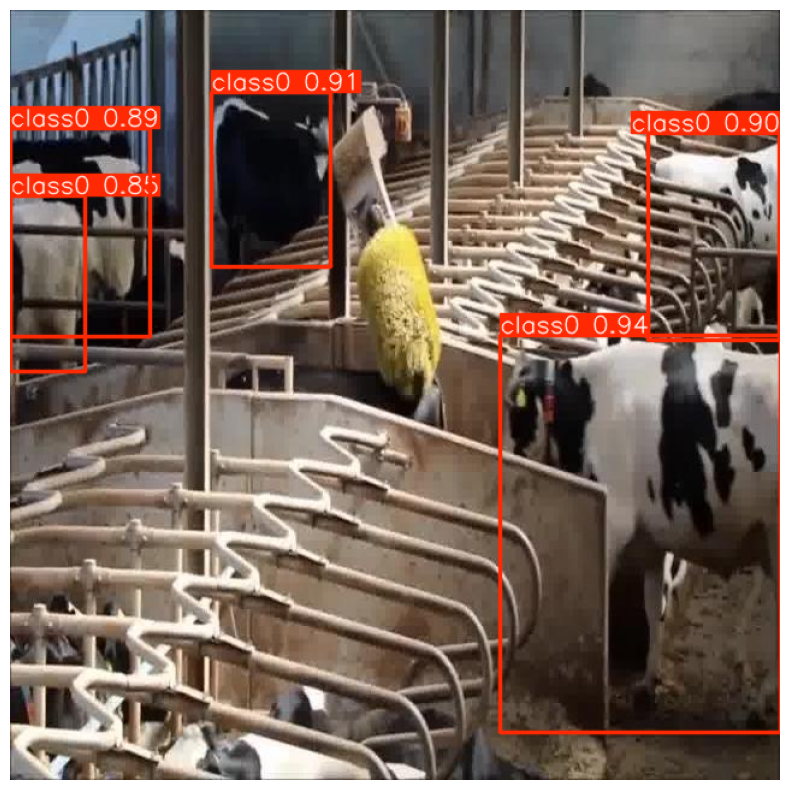

Prediction for image: hf02-32_jpeg_jpg.rf.ab8bb6ddb47495bd602bb9bdd5f63acf.jpg

0: 640x640 3 class0s, 37.1ms
Speed: 2.2ms preprocess, 37.1ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)


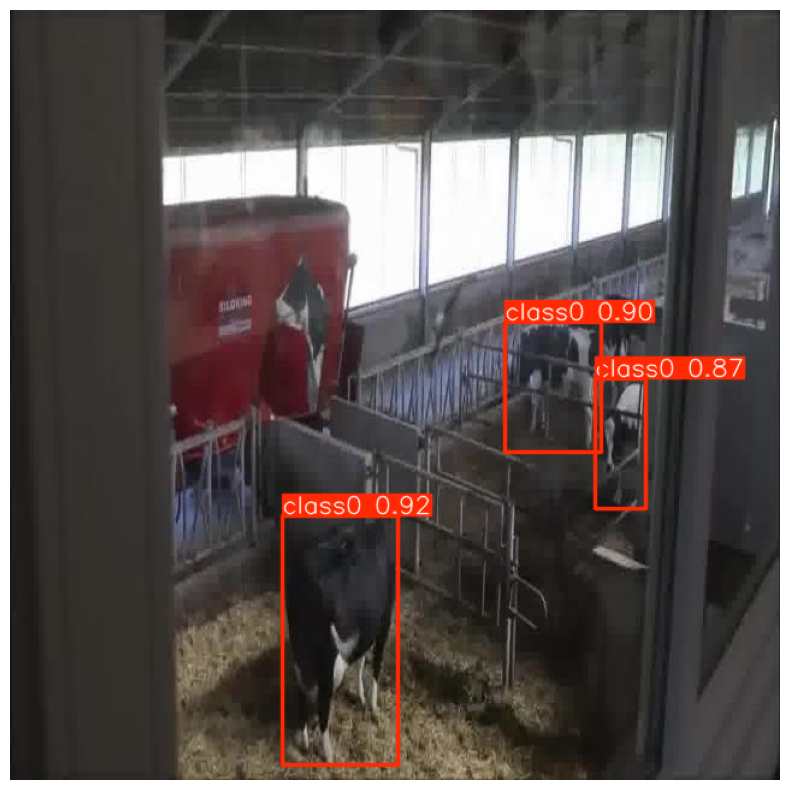

Prediction for image: img00151_jpg.rf.7dac751f570fcadfcf4d57f915c5d61b.jpg

0: 640x640 1 class0, 1 class5, 1 class8, 37.1ms
Speed: 3.6ms preprocess, 37.1ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


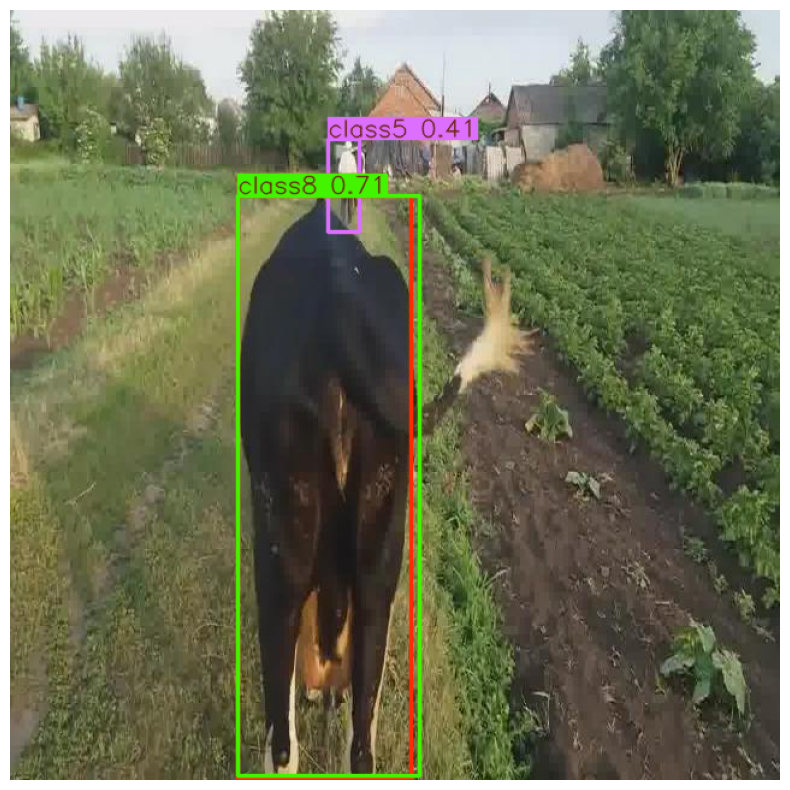

Prediction for image: hf03-53_jpeg_jpg.rf.408cd913067272408aa1c884e1826978.jpg

0: 640x640 8 class0s, 47.0ms
Speed: 2.1ms preprocess, 47.0ms inference, 5.6ms postprocess per image at shape (1, 3, 640, 640)


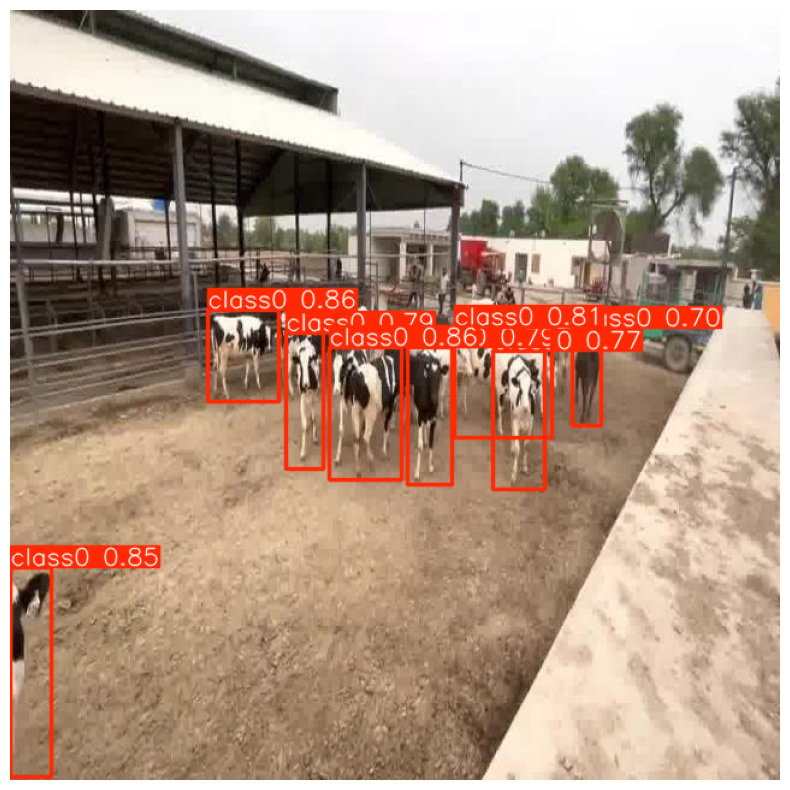

Prediction for image: Ayrshirecattle65_c_jpg.rf.af39a0a11ba6830a0682a07edf7eea3d.jpg

0: 640x640 1 class7, 40.0ms
Speed: 5.3ms preprocess, 40.0ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


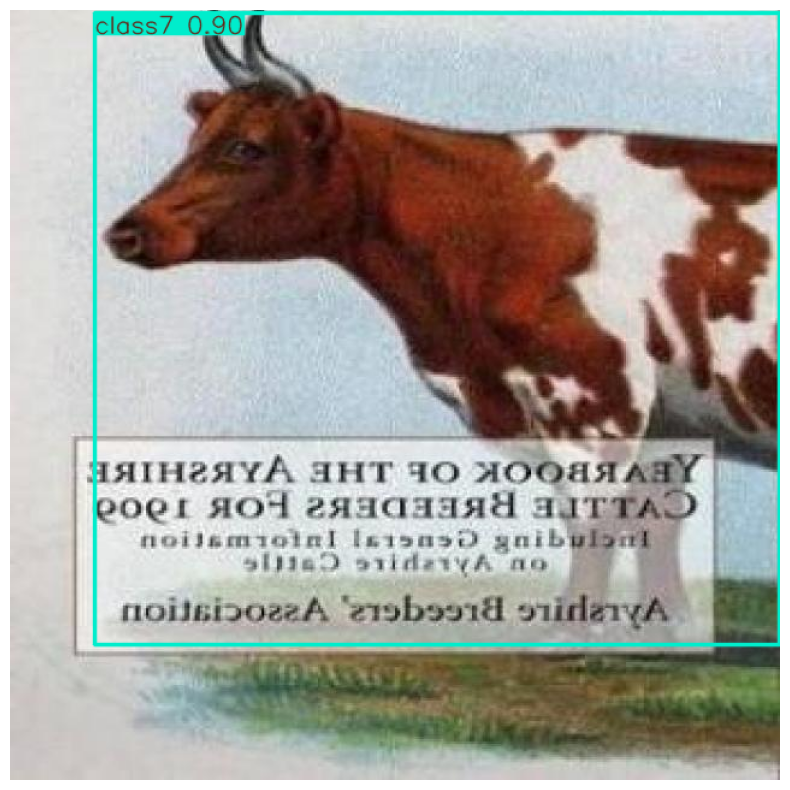

In [ ]:
import cv2
import matplotlib.pyplot as plt
from pathlib import Path
from ultralytics import YOLO

# Load your trained YOLOv8 model
model_path = '/content/drive/MyDrive/dataset/Cows and Buffalo/yolov8l.pt'
model = YOLO(model_path)

# Path to test images
test_images_dir = Path('/content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/test/images')

def predict_and_show(image_path):
    img = cv2.imread(str(image_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Make prediction
    results = model.predict(img_rgb)
    result_img = results[0].plot()

    # Display
    plt.figure(figsize=(10,10))
    plt.imshow(result_img)
    plt.axis('off')
    plt.show()

# Show predictions for first 5 images

image_files = list(test_images_dir.glob('*.jpg'))
for idx, img_file in enumerate(image_files[1:], start=2):
    print(f'Prediction for image: {img_file.name}')
    predict_and_show(img_file)
    if idx > 5:
        break


##**Model Comparison**

In [7]:
# List trained model files and names
models_info = [
    {'path': '/content/drive/MyDrive/dataset/Cows and Buffalo/yolov8s.pt', 'name': 'YOLOv8s'},
    {'path': '/content/drive/MyDrive/dataset/Cows and Buffalo/yolov8m.pt', 'name': 'YOLOv8m'},
    {'path': '/content/drive/MyDrive/dataset/Cows and Buffalo/yolov8l.pt', 'name': 'YOLOv8l'}
]

val_data_path = '/content/drive/MyDrive/dataset/Cows and Buffalo/cows_buffalo.yaml'

# Collect comparison results
overall_results = []
per_class_results = {}

for info in models_info:
    overall, per_class_df = evaluate_model(info['path'], info['name'], val_data_path)
    overall_results.append(overall)                     # For overall metrics comparison
    per_class_results[info['name']] = per_class_df      # For per-class comparison

# Create overall metrics DataFrame
df_overall = pd.DataFrame(overall_results)

print("All Models Metrics:")
print(df_overall)


Ultralytics 8.3.202 🚀 Python-3.12.11 torch-2.8.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
val: Fast image access ✅ (ping: 1.9±2.1 ms, read: 0.1±0.1 MB/s, size: 68.2 KB)
val: Scanning /content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/val/labels.cache... 262 images, 0 backgrounds, 7 corrupt: 100% ━━━━━━━━━━━━ 262/262 339.8Kit/s 0.0s
val: /content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/val/images/Ayrshirecattle106_c_jpg.rf.3e705969cdb08277e562bcb41e5f4bd4.jpg: ignoring corrupt image/label: Label class 11 exceeds dataset class count 10. Possible class labels are 0-9
val: /content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/val/images/Ayrshirecattle107_c_jpg.rf.94743495a64f99326614a03202839ec6.jpg: ignoring corrupt image/label: Label class 11 exceeds dataset class count 10. Possible class labels are 0-9
val: /content/drive/MyDrive/dataset/Cows and Buffalo/split_dataset/val/images/Ayrshirecattle116_jpg.rf.aa4e9e14d02306f4141994d448518be5.jpg: ignoring corrupt i

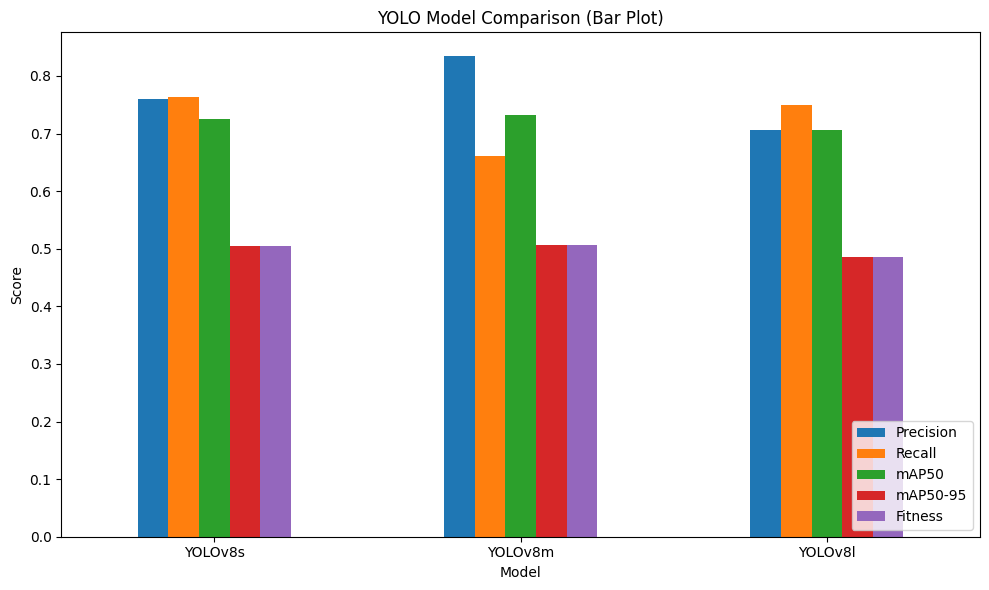

In [11]:
import matplotlib.pyplot as plt

# Compare key metrics - choose you want to plot
metrics_to_plot = ['Precision', 'Recall', 'mAP50', 'mAP50-95', 'Fitness']
df_overall.plot(x='Model', y=metrics_to_plot, kind='bar', figsize=(10, 6))
plt.title('YOLO Model Comparison (Bar Plot)')
plt.ylabel('Score')
plt.xticks(rotation=0)
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


**Find the Best Model (by mAP50-95)**

In [9]:
best_model_row = df_overall.loc[df_overall['mAP50-95'].idxmax()]
print(f"\nBest YOLO Model: {best_model_row['Model']} (mAP50-95: {best_model_row['mAP50-95']:.3f})")



Best YOLO Model: YOLOv8m (mAP50-95: 0.507)


**Per-Class Comparison Plot**

To compare per-class mAP50 scores plot per-class results for all models

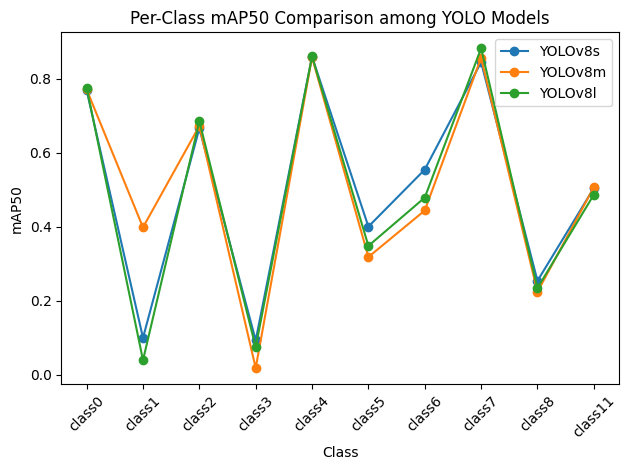

In [10]:
for model_name, class_df in per_class_results.items():
    plt.plot(class_df['Class'], class_df['mAP50'], marker='o', label=model_name)

plt.title('Per-Class mAP50 Comparison among YOLO Models')
plt.xlabel('Class')
plt.ylabel('mAP50')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


# Conclusion

- Developed and evaluated an object detection pipeline for identifying cows and buffalo using the YOLOv8 architecture  
- Performed data loading and exploratory analysis to understand dataset structure and distribution  
- Addressed class imbalance through targeted data augmentation techniques  
- Trained and compared multiple models (YOLOv8s, YOLOv8m, YOLOv8l) for performance benchmarking  
- Conducted model evaluation on the validation set using standard detection metrics  
- Found YOLOv8m to deliver the best results based on the mAP50-95 metric  
- Gained hands-on experience in custom dataset preparation, object detection workflows, and model comparison

